In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean.cm as cmo
import cartopy.crs as ccrs
import gsw

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)


from utils import *

In [3]:
ds = load_climatology_with_deptho()
ds

<xarray.Dataset>
Dimensions:    (month: 12, depth: 39, latitude: 121, longitude: 1440)
Coordinates:
  * depth      (depth) float32 0.5058 1.556 2.668 3.856 ... 370.7 411.8 457.6
  * latitude   (latitude) float32 60.0 60.25 60.5 60.75 ... 89.5 89.75 90.0
  * longitude  (longitude) float32 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    S          (month, depth, latitude, longitude) float32 32.93 32.91 ... 34.88
    T          (month, depth, latitude, longitude) float32 2.22 2.256 ... 0.6027
    SIC        (month, latitude, longitude) float32 0.0008339 ... 0.982
    SIT        (month, latitude, longitude) float32 0.002912 0.002652 ... 1.954
    U          (month, depth, latitude, longitude) float32 -0.04629 ... 0.000...
    V          (month, depth, latitude, longitude) float32 0.06839 ... 0.000531
    SSH        (month, latitude, longitude) float32 -0.08223 ... -0.5848
    deptho     (latitude, longitude) float64 2.502e+03 2.01e+03 ... nan nan
Attributes:
    history:      Creation 2023-October-31 12:55:11 GMT+0200
    source:       Copernicus Marine Service
    title:        Monthly mean fields for product GLOBAL_MULTIYEAR_PHY_ENS_00...
    references:   http://marine.copernicus.eu
    Conventions:  CF-1.6
    institution:  Mercator Ocean
    credit:       E.U. Copernicus Marine Service Information (CMEMS)
    producer:     CMEMS - Global Monitoring and Forecasting Centre
    contact:      servicedesk.cmems@mercator-ocean.eu

In [4]:
lon = ds.longitude
lat = ds.latitude
proj = ccrs.NorthPolarStereo()
proj_og = ccrs.PlateCarree()

In [5]:
U_mean = ds['U'].mean('depth')
V_mean = ds['V'].mean('depth')
Mag = np.sqrt(U_mean**2 + V_mean**2)

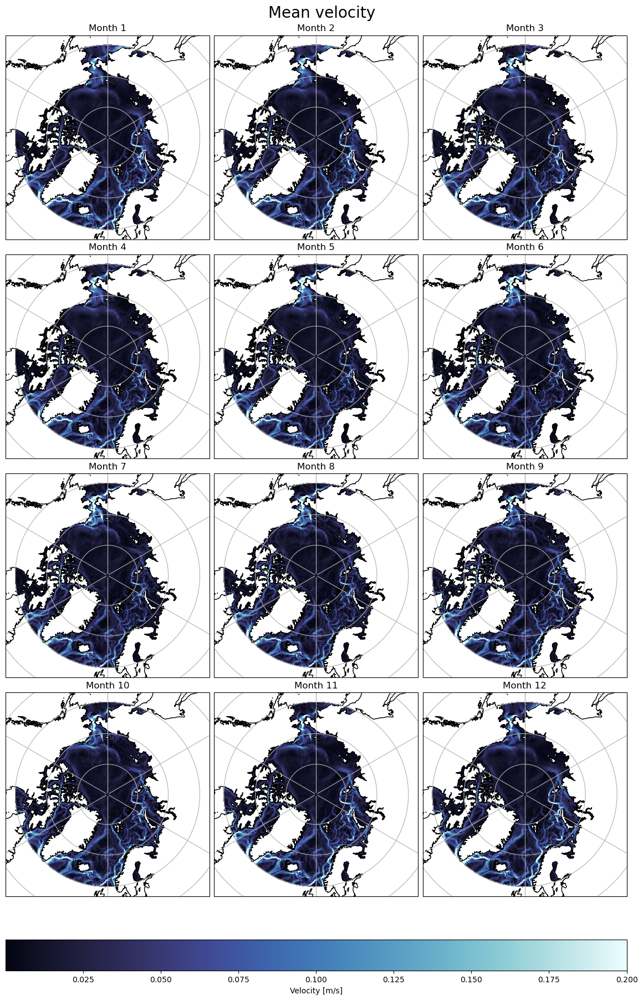

In [6]:
fig, axs = plt.subplots(4, 3, subplot_kw={'projection': proj}, figsize=(12, 18), layout='compressed')
for i, ax in enumerate(axs.flat):
    month = i + 1
    Mag_month = Mag.sel(month=month)
    ax = axs.flat[i]
    pc = ax.pcolormesh(lon, lat, Mag_month, transform=proj_og, cmap=cmo.ice, vmax = 0.2)
    ax.set_title(f'Month {month}')
    ax.coastlines()
    ax.gridlines()
fig.suptitle("Mean velocity", fontsize=20)
fig.colorbar(pc, ax=axs, orientation='horizontal', label='Velocity [m/s]')
plt.show()

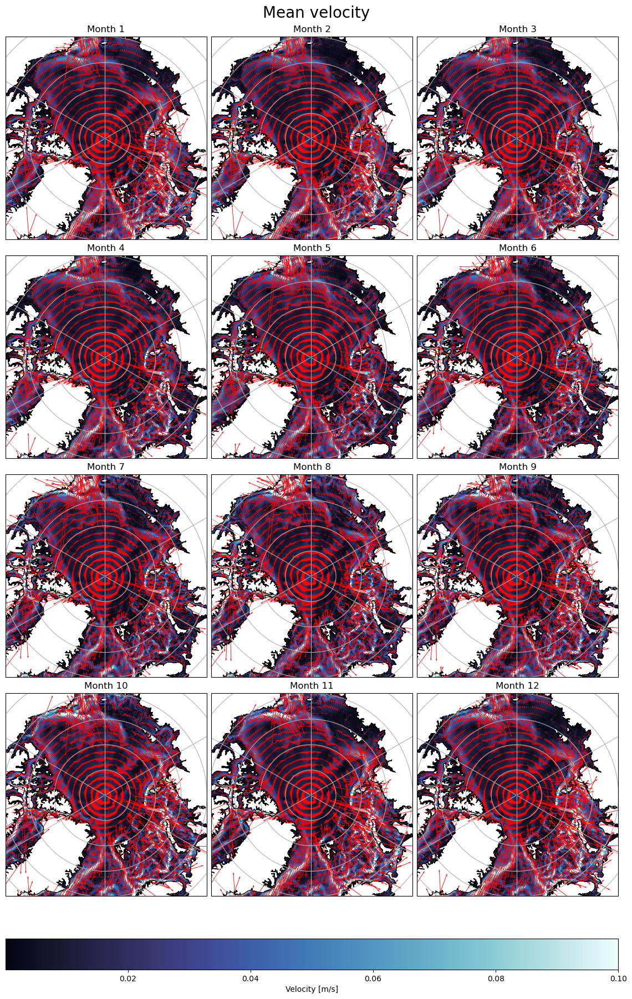

In [7]:
n = 5
fig, axs = plt.subplots(4, 3, subplot_kw={'projection': proj}, figsize=(12, 18), layout='compressed')
for i, ax in enumerate(axs.flat):
    month = i + 1
    Mag_month = Mag.sel(month=month)
    U_mean_month = U_mean.sel(month=month)
    V_mean_month = V_mean.sel(month = month)
    ax = axs.flat[i]
    pc = ax.pcolormesh(lon,lat, Mag_month, transform=proj_og, cmap=cmo.ice, vmax=0.1)
    quiver = ax.quiver(lon[::n].values,lat[ ::n].values, U_mean_month[::n, ::n].values,V_mean_month[::n, ::n].values,scale=1, color='red', transform=proj_og)
    ax.set_title(f'Month {month}')
    ax.coastlines()
    ax.gridlines()
    ax.set_extent([-180, 180, 70, 90], crs=proj_og)
fig.suptitle("Mean velocity", fontsize=20)
fig.colorbar(pc, ax=axs, orientation='horizontal', label='Velocity [m/s]')
plt.show()

In [8]:
U_50 = ds['U'].isel(depth=slice(0, 50)).mean('depth')
V_50 = ds['V'].isel(depth=slice(0, 50)).mean('depth')
Mag_50 = np.sqrt(U_50**2 + V_50**2)

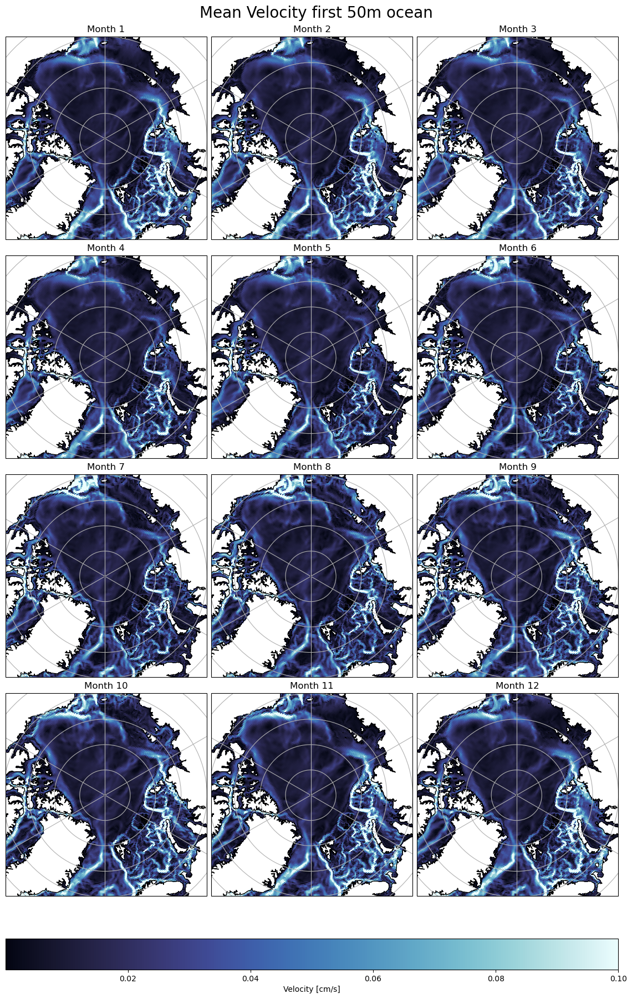

In [10]:
fig, axs = plt.subplots(4, 3, subplot_kw={'projection':proj}, figsize=(12, 18), layout='compressed')
for i, ax in enumerate(axs.flat):
    month = i + 1
    Mag_month_50 = Mag_50.sel(month=month)
    ax = axs.flat[i]
    pc = ax.pcolormesh(lon, lat, Mag_month_50, transform=proj_og, cmap=cmo.ice, vmax = 0.1)
    ax.set_title(f'Month {month}')
    ax.coastlines()
    ax.gridlines()
    ax.set_extent([-180, 180, 70, 90], crs=proj_og)
fig.suptitle("Mean Velocity first 50m ocean", fontsize=20)
fig.colorbar(pc, ax=axs, orientation='horizontal', label='Velocity [cm/s]')
plt.show()